In [1]:
import os


if "original_dir" in globals():
    # current_dir = os.path.dirname(original_dir)
    current_dir = original_dir
    os.chdir(current_dir)
    print(f"Current directory: {current_dir}")
else:
    original_dir = os.getcwd()
    print(f"Current directory: {original_dir}")

os.chdir("../")
print(f"Changed directory: {os.getcwd()}")

Current directory: d:\northeastern\neu_dev\neumove_org\myoassist\docs
Changed directory: d:\northeastern\neu_dev\neumove_org\myoassist


In [2]:
import numpy as np
from myoassist_rl.rl_train.utils.data_types import DictionableDataclass
from myoassist_rl.rl_train.utils.environment_handler import EnvironmentHandler
from myoassist_rl.envs import myoassist_leg_imitation_exo
from myoassist_rl.rl_train.utils.data_types import DictionableDataclass

MyoSuite:> Registering Myo Envs


In [3]:
config = DictionableDataclass.create(myoassist_leg_imitation_exo.ExoImitationTrainSessionConfig, None)
config.env_params.env_id = "myoAssistLegImitationExo-v0"
config.env_params.safe_height = 0.0
config.env_params.out_of_trajectory_threshold = 1000
config.env_params.model_path = "myosuite/simhive/myoassist_sim/myoLeg26_TUTORIAL.xml"
config.env_params.reference_data_path = "reference_data/short_reference_gait.npz"
config.env_params.num_envs = 1
config.env_params.reference_data_keys = ["ankle_angle_l", "ankle_angle_r",
                                "hip_flexion_l", "hip_flexion_r",
                                "hip_adduction_l", "hip_adduction_r",
                                "hip_rotation_l", "hip_rotation_r",
                                "knee_angle_l", "knee_angle_r",
                                "pelvis_tilt", "pelvis_list", "pelvis_rotation",
                                "pelvis_tx", "pelvis_ty", "pelvis_tz"
                                ]

# Load reference data and replay

In [4]:
ref_data_dict = EnvironmentHandler.load_reference_data(config)

Loading reference data from reference_data/short_reference_gait.npz


In [5]:
envw = EnvironmentHandler.create_environment(config, False)
env:myoassist_leg_imitation_exo.MyoAssistLegImitationExo = envw.unwrapped

Loading reference data from reference_data/short_reference_gait.npz
config.env_params.env_id='myoAssistLegImitationExo-v0'
=================environment seed: 0=====================
=================environment model_path: myosuite/simhive/myoassist_sim/myoLeg26_TUTORIAL.xml=====================
    NeuMove MyoLegBase
    
===============================PARAMETERS=============================
self._reward_keys_and_weights=ImitationTrainSessionConfig.EnvParams.RewardWeights(forward_reward=0.01, muscle_activation_penalize=0.1, muscle_activation_diff_penalize=0.1, footstep_delta_time=0.0, average_velocity_per_step=0.0, muscle_activation_penalty_per_step=0.0, foot_force_penalize=0.0, qpos_imitation_rewards={}, qvel_imitation_rewards={}, end_effector_imitation_reward=0.3)
===============================PARAMETERS=============================
DEBUG:: self.observation_joint_pos_keys=[]
DEBUG:: self.observation_joint_vel_keys=[]
DEBUG:: obs: len(observation)=27
DEBUG:: action: self.sim.model.nu

In [6]:
env.reset(seed=0)
frames = []
for step in range(60):
    # obs, reward, done, truncated, info = env.step(np.zeros(env.action_space.shape))
    env.imitation_step(True)
    
    frame = env.sim.renderer.render_offscreen(camera_id=1,
                                                width=1920//2,
                                                height=1080//2)
    frames.append(frame)


In [7]:
import mediapy
mediapy.show_video(frames, fps=30)

# Load pretrained model and evaluate

In [8]:
import os
from myoassist_rl.rl_train.utils.handlers.train_log_handler import TrainLogHandler
from myoassist_rl.rl_train.utils.handlers.train_checkpoint_data_imitation import ImitationTrainCheckpointData

log_folder_name = "train_session_20250723-141709-tutorial"
log_dir = os.path.join("pretrained_models",log_folder_name)
analyze_result_dir = os.path.join(log_dir,"analyze_results")
if not os.path.exists(analyze_result_dir):
    os.makedirs(analyze_result_dir)

log_handler = TrainLogHandler(log_dir,"session_name")
log_handler.load_log_data(ImitationTrainCheckpointData)

In [9]:
from myoassist_rl.rl_train.utils.data_types import DictionableDataclass
DictionableDataclass.to_dict(log_handler.log_datas[-1])

{'approx_kl': 0.013080626726150513,
 'clip_fraction': 0.12594401041666667,
 'clip_range': 0.2,
 'clip_range_vf': 100.0,
 'entropy_loss': -20.87381032307943,
 'explained_variance': 0.3027176856994629,
 'learning_rate': 0.0001,
 'loss': 1.954842209815979,
 'n_updates': 36308,
 'policy_gradient_loss': -0.014778216877796997,
 'std': 0.5645464658737183,
 'value_loss': 4.026332267125448,
 'num_timesteps': 9969664,
 'average_num_timestep': 225.12056737588654,
 'average_reward_per_episode': 37.42848526758956,
 'average_reward_dict_per_episode': {'forward_reward': 35.78512211371619,
  'muscle_activation_penalize': 28.734496954215984,
  'muscle_activation_diff_penalize': 54.770940760753106,
  'foot_force_penalize': 55.50949552454264,
  'muscle_activation_penalty_per_step': -258.0366372025792,
  'average_velocity_per_step': -2.2660976088792406,
  'footstep_delta_time': 24.655543735224462,
  'qpos_imitation_rewards': 110.96251871132169,
  'qvel_imitation_rewards': 31.67647962730603,
  'end_effecto

## Plot Learning Curve

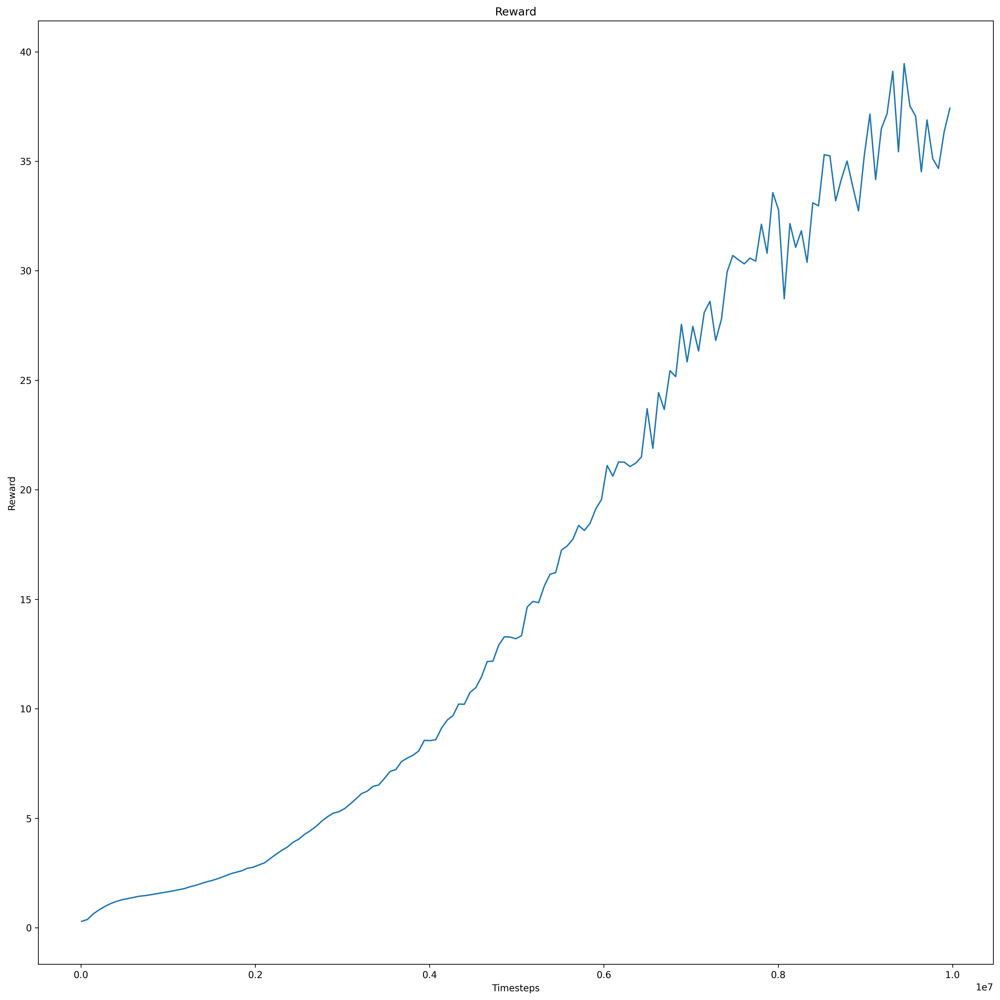

In [10]:
import sys
sys.modules.pop('package.train_log_analyzer', None)
from myoassist_rl.rl_train.analyzer.train_log_analyzer import TrainLogAnalyzer
train_log_analyzer = TrainLogAnalyzer(log_handler)
train_log_analyzer.plot_reward(result_dir=analyze_result_dir, show_plot=True)


## Load Session Config

In [11]:
import json
from myoassist_rl.rl_train.utils.config_imitation import ImitationTrainSessionConfig
from myoassist_rl.rl_train.utils.data_types import DictionableDataclass
with open(os.path.join(log_dir, "session_config.json"), 'r') as f:
    config_dict = json.load(f)
config = DictionableDataclass.create(ImitationTrainSessionConfig, config_dict)


In [12]:
from myoassist_rl.envs.myoassist_leg_base import MyoAssistLegBase
gait_data_name = f"{log_handler.session_name}_gait_evaluated_data.json"
if os.path.exists(os.path.join(analyze_result_dir, gait_data_name)):
    user_input = input(f"Regenerate evaluate data? ({gait_data_name}) (y/n(anything))")
else:
    user_input = "y"
is_regen_evaluating_data = True if user_input == "y" else False

from myoassist_rl.rl_train.analyzer.gait_evaluate import ImitationGaitEvaluator
gait_evaluator = ImitationGaitEvaluator(log_handler, config)
gait_evaluator.load_reference_data()
gait_evaluator.initialize_env()
if is_regen_evaluating_data:
    gait_data_path = gait_evaluator.evaluate(result_dir=analyze_result_dir,
                                            file_name=gait_data_name,
                                            velocity_mode=MyoAssistLegBase.VelocityMode.UNIFORM,
                                            target_velocity_period=3,
                                            )
else:
    gait_data_path = os.path.join(analyze_result_dir, gait_data_name)
    

===============REFERENCE DATA LOADING================
===============REFERENCE DATA LOADING DONE================
Loading reference data from reference_data/short_reference_gait.npz
config.env_params.env_id='myoAssistLegImitationExo-v0'
=================environment seed: 1234=====================
=================environment model_path: myosuite/simhive/myoassist_sim/myoLeg22_2D_TUTORIAL.xml=====================
===============================PARAMETERS=============================
self._reward_keys_and_weights=ImitationTrainSessionConfig.EnvParams.RewardWeights(forward_reward=0.2, muscle_activation_penalize=0.1, muscle_activation_diff_penalize=0.1, footstep_delta_time=0.0, average_velocity_per_step=0.0, muscle_activation_penalty_per_step=0.0, foot_force_penalize=0.5, qpos_imitation_rewards={'pelvis_ty': 0.4, 'pelvis_tilt': 0.4, 'hip_flexion_l': 0.2, 'hip_flexion_r': 0.2, 'knee_angle_l': 0.2, 'knee_angle_r': 0.2, 'ankle_angle_l': 0.2, 'ankle_angle_r': 0.2}, qvel_imitation_rewards={'pelv

In [15]:
import sys
sys.modules.pop('package.gait_analyze', None)
sys.modules.pop('package.gait_evaluate', None)
from myoassist_rl.rl_train.analyzer.gait_analyze import GaitAnalyzer
from myoassist_rl.rl_train.analyzer.gait_evaluate import GaitData


gait_data = GaitData()
gait_data.read_json_data(gait_data_path)
segmented_ref_data = np.load("reference_data/segmented.npz", allow_pickle=True)
segmented_ref_data = {key: segmented_ref_data[key] for key in segmented_ref_data.files}
gait_analyzer = GaitAnalyzer(gait_data, segmented_ref_data, True)

self.gait_data.series_data.keys()=dict_keys(['joint_data', 'actuator_data', 'sensor_data', 'physics_data', 'target_data'])


d:\northeastern\neu_dev\neumove_org\myoassist\myoassist_rl\rl_train\analyzer\gait_analyze.py:147: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[4][1].legend()


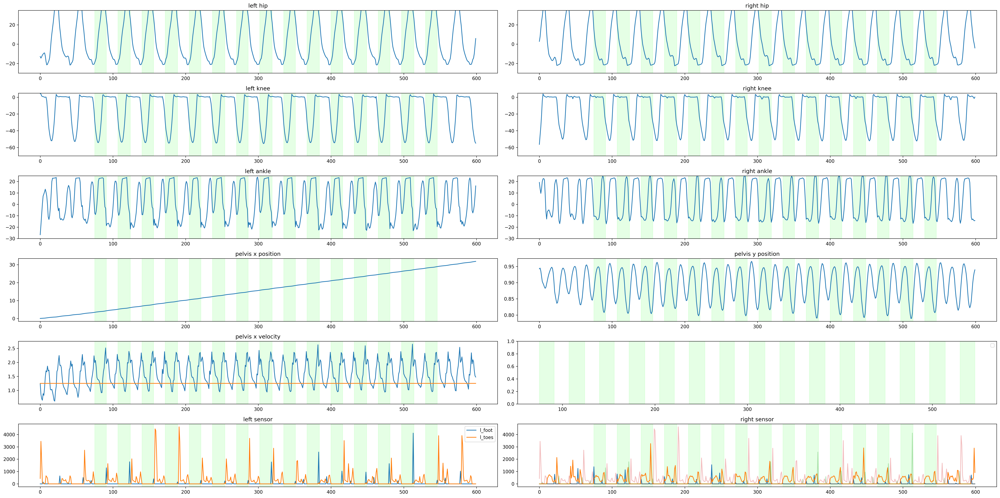

In [16]:
gait_analyzer.plot_entire_result(result_dir=analyze_result_dir,is_right_foot_based=True)


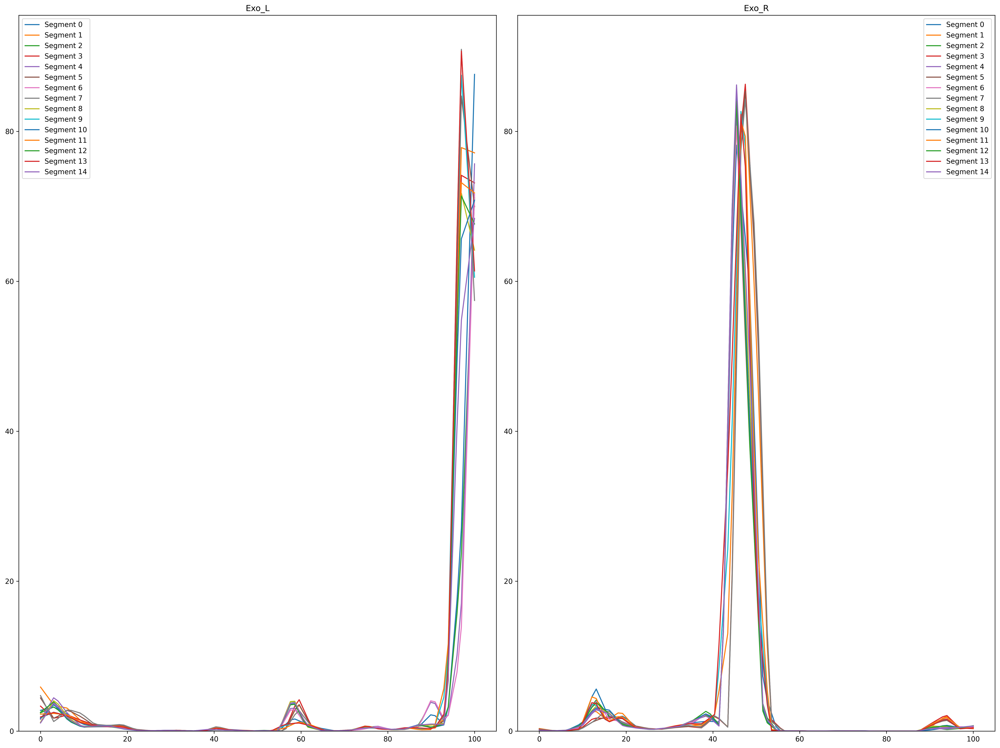

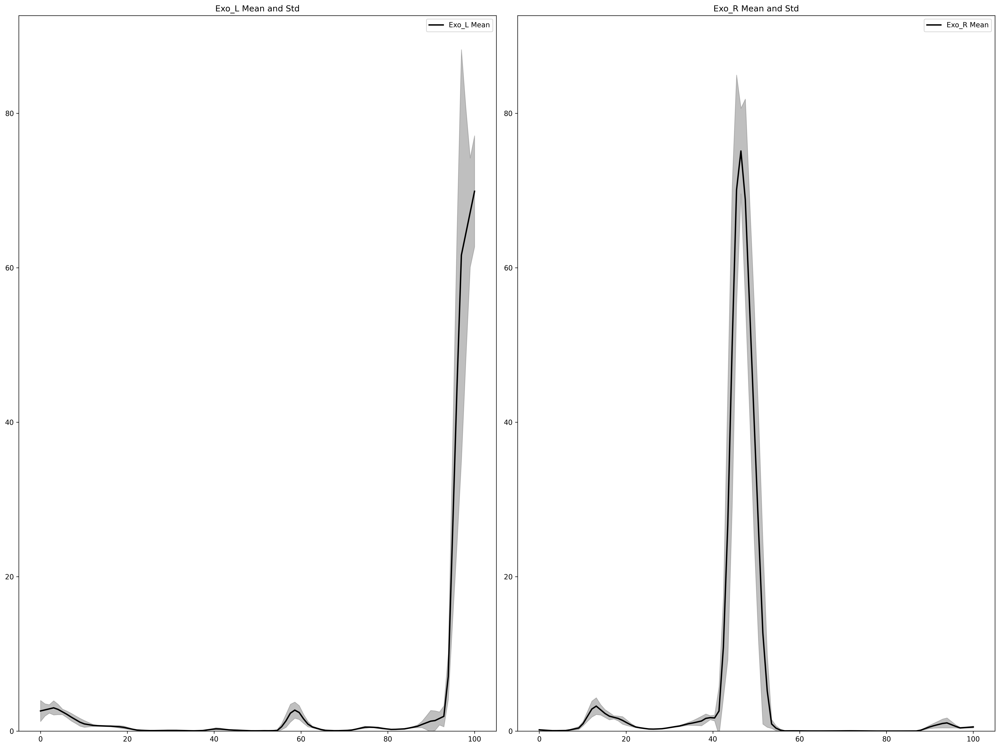

In [17]:
gait_analyzer.plot_exo_segmented_data(result_dir=analyze_result_dir)

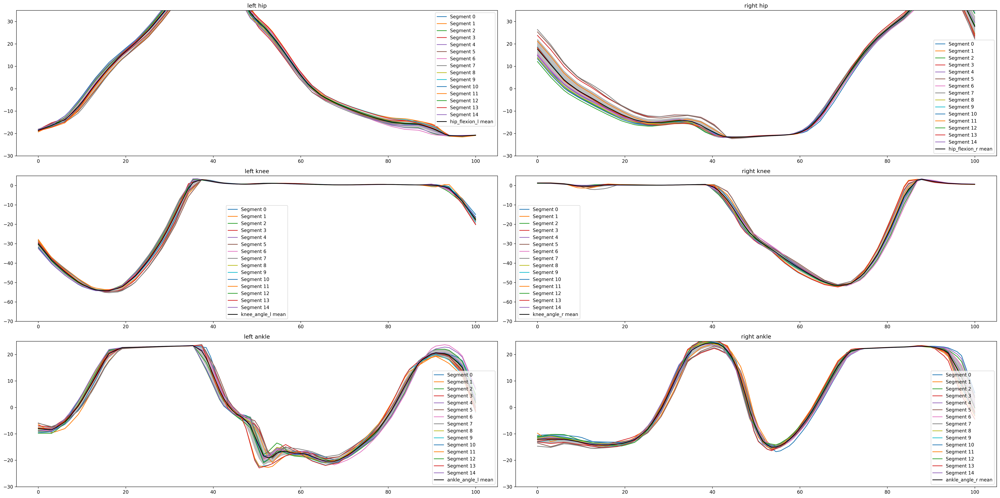

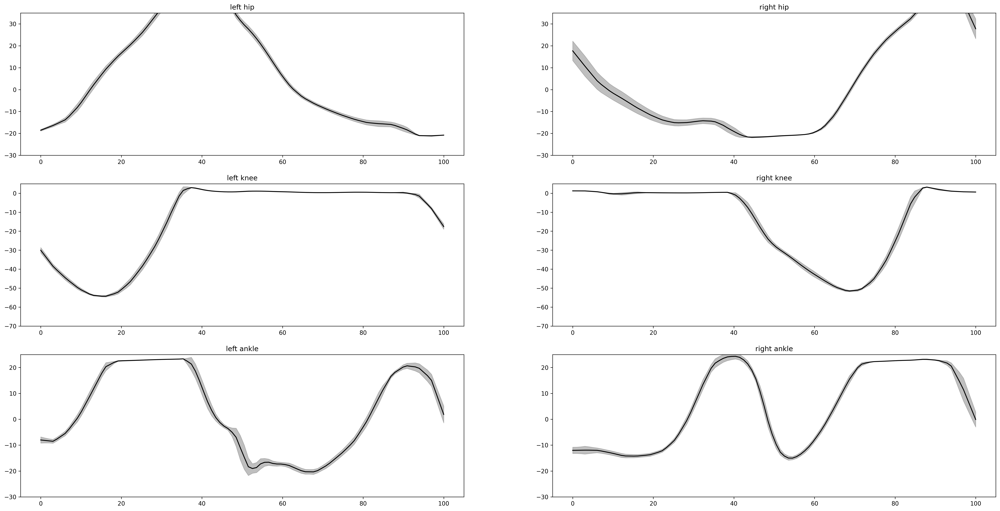

In [18]:
gait_analyzer.plot_segmented_kinematics_result(result_dir=analyze_result_dir)